In [251]:
import h5py
import numpy as np
import os
from datetime import datetime
import dascore as dc
import pandas as pd
import random
import seaborn as sns
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import plotly.express as px
import scipy.stats as stats
import plotly.graph_objects as go
from scipy.signal import savgol_filter
from scipy.signal import spectrogram


def plot_fft(selected_patch, selected_channels, smooth=True):
    # Compute the FFT
    Fs = 1/(selected_patch.attrs.coords['time'].step / np.timedelta64(1, 's'))
    N, L = selected_patch.data.shape

    X = np.fft.fft(selected_patch.data, axis=1)
    X = np.abs(X / L)
    X = X[:,:L//2]
    X[:, 1:-1] = 2 * X[:, 1:-1]  # Compensate for the dropped half

    # Frequency axis
    f = np.fft.fftfreq(L, d=1/Fs)[:L//2]  # Frequency axis

    # Plotting
    plt.figure(figsize=(10, 6))
    for i in selected_channels:
        if smooth:
            plt.plot(f, savgol_filter(X[i], window_length=50, polyorder=3), label=f'Channel {i}')
        else:
            plt.plot(f, X[i], label=f'Channel {i+1}')

    plt.title('Amplitude Spectrum of a Selected Channels')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Amplitude')
    plt.grid()
    plt.legend()
    plt.show()


catalog_path_A = 'GES16Aand16BStimulationMonitoringApril2024/16AStimulationCatalogues'
catalog_path_B = 'GES16Aand16BStimulationMonitoringApril2024/16BStimulationCatalogues'

output_folder = 'data_statistics'
show_images = False
num_images = 5
width_mm = 85
dpi = 300
width_in = width_mm / 25.4
height_in = width_in * 0.75

dataframes = []
for file_name in os.listdir(catalog_path_A):
    file_path = os.path.join(catalog_path_A, file_name)
    if file_name.endswith('.csv') and file_name.startswith('FORGE'):
        df = pd.read_csv(file_path)
        if not df.empty:
            dataframes.append(df)

for file_name in os.listdir(catalog_path_B):
    file_path = os.path.join(catalog_path_B, file_name)
    if file_name.endswith('.csv') and file_name.startswith('FORGE'):
        df = pd.read_csv(file_path)
        if not df.empty:
            dataframes.append(df)

catalog_df = pd.concat(dataframes, ignore_index=True)
catalog_df.columns = catalog_df.columns.str.strip().str.replace(' ', '_')
catalog_df = catalog_df[catalog_df['Depth'] > 0]

catalog_df

,Source,Trig_Date,Trig_Time,Origin_Date,Origin_Time,Profile,Status,Cluster,Y,X,...,MomMag,PGV,Stage,P_S/N,S_S/N,Quality,Error,Location,rms_Noise,Matched_File
0,147.0,7/4/2024,14:15:33.639500,7/4/2024,14:15:33.476563,Primary,2.0,0.0,-2250.0,2270.0,...,-0.37,36.12,Post Stim,28.5,45.8,1.8,1000000.0,L2 msmx,8.24,16B_StrainRate_20240407T201528+0000_38443.h5
1,164.0,7/4/2024,14:16:12.332750,7/4/2024,14:16:12.374339,Primary,2.0,0.0,-2260.0,2280.0,...,0.09,55.53,Post Stim,27.4,46.0,2.0,1000000.0,L2 msmx,7.87,16B_StrainRate_20240407T201604+0000_38446.h5
2,187.0,7/4/2024,14:16:55.954500,7/4/2024,14:16:55.974545,Primary,2.0,0.0,-390.0,2100.0,...,0.65,477.11,Post Stim,58.4,148.0,5.0,1000000.0,L2 msmx,7.84,16B_StrainRate_20240407T201652+0000_38450.h5
3,257.0,7/4/2024,14:19:30.439250,7/4/2024,14:19:30.597845,Primary,2.0,0.0,-350.0,2110.0,...,0.46,247.66,Post Stim,27.1,52.6,3.6,1000000.0,L2 msmx,7.83,16B_StrainRate_20240407T201928+0000_38463.h5
4,429.0,7/4/2024,14:25:47.111250,7/4/2024,14:25:46.986282,Primary,2.0,0.0,-2290.0,2310.0,...,0.10,165.47,Post Stim,41.0,97.0,2.4,1000000.0,L2 msmx,8.01,16B_StrainRate_20240407T202540+0000_38494.h5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2977,163.0,17/4/2024,16:26:41.243750,17/4/2024,16:26:40.864426,Primary,2.0,0.0,-3050.0,-3540.0,...,-0.64,3.24,4,9.7,12.6,1.2,1000000.0,L2 msmx,29.61,16B_StrainRate_20240417T222640+0000_111099.h5
2978,150.0,20/4/2024,05:58:38.199000,20/4/2024,05:58:38.055386,Primary,2.0,0.0,-50.0,2320.0,...,-0.65,38.40,5,5.5,8.8,1.5,1000000.0,L2 msmx,33.94,16B_StrainRate_20240420T115828+0000_129558.h5
2979,982.0,21/4/2024,19:47:57.249250,21/4/2024,19:47:57.057041,Primary,2.0,0.0,-5000.0,2340.0,...,-0.22,12.15,5,361.5,18.6,1.2,1000000.0,L2 msmx,32.86,16B_1_StrainRate_20240422T014756+0000_1241.h5
2980,1360.0,22/4/2024,20:03:02.198250,22/4/2024,20:03:02.002227,Primary,2.0,0.0,-5060.0,2360.0,...,-0.15,14.20,5,356.1,10.2,1.1,1000000.0,L2 msmx,27.71,16B_1_StrainRate_20240423T020256+0000_8516.h5


In [2]:
selected_events = catalog_df[catalog_df['Matched_File'].notna()]
selected_events = selected_events.sort_values(by='MomMag', ascending=False).head(num_images)

selected_events

,Source,Trig_Date,Trig_Time,Origin_Date,Origin_Time,Profile,Status,Cluster,Y,X,...,MomMag,PGV,Stage,P_S/N,S_S/N,Quality,Error,Location,rms_Noise,Matched_File
386,7847.0,7/4/2024,01:21:19.734250,7/4/2024,01:21:19.527279,Primary,2.0,0.0,-2170.0,2150.0,...,1.42,187.75,10,31.5,56.2,4.2,1000000.0,L2 msmx,57.00,16B_StrainRate_20240407T072116+0000_34572.h5
439,2723.0,7/4/2024,09:55:59.241750,7/4/2024,09:55:59.399738,Primary,2.0,0.0,-1750.0,2320.0,...,1.31,370.24,25,18.5,43.7,4.6,1000000.0,L2 msmx,21.15,16B_StrainRate_20240407T155552+0000_37145.h5
2685,514.0,6/4/2024,18:18:03.582000,6/4/2024,18:18:03.388462,Primary,2.0,0.0,-2000.0,2090.0,...,1.29,187.75,9,31.6,48.3,2.0,1000000.0,L2 msmx,48.80,16B_StrainRate_20240407T001752+0000_32455.h5
443,3678.0,7/4/2024,10:29:06.890500,7/4/2024,10:29:06.696715,Primary,2.0,0.0,-2240.0,2190.0,...,0.98,190.28,25,34.6,60.8,3.6,1000000.0,L2 msmx,21.86,16B_StrainRate_20240407T162904+0000_37311.h5
367,6220.0,7/4/2024,00:26:54.294250,7/4/2024,00:26:54.070648,Primary,2.0,0.0,-2210.0,2230.0,...,0.95,187.75,10,22.2,25.5,2.9,1000000.0,L2 msmx,16.59,16B_StrainRate_20240407T062652+0000_34300.h5


In [3]:
forge_path = '/bedrettolab/E1B/DAS/2024_FORGE/DATA_RAW_fromOpenei/April_2024/v1.0.0'
file_name = selected_events['Matched_File'].values[0]
file_path = os.path.join(forge_path, file_name)

patch = dc.spool(file_path)[0].transpose()

patch.viz.waterfall(show=True, scale=0.05);

File: 16B_StrainRate_20240407T072116+0000_34572.h5
Time: 01:21:19.734250
Date: 7/4/2024
Magnitude: 1.42
Error: 1000000.0
rms: 57.0


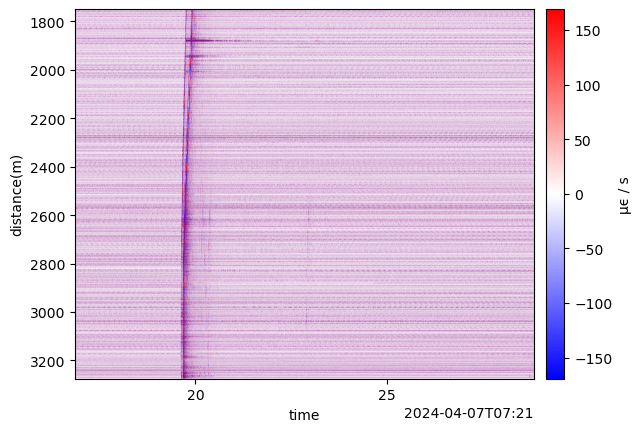

File: 16B_StrainRate_20240407T155552+0000_37145.h5
Time: 09:55:59.241750
Date: 7/4/2024
Magnitude: 1.31
Error: 1000000.0
rms: 21.15


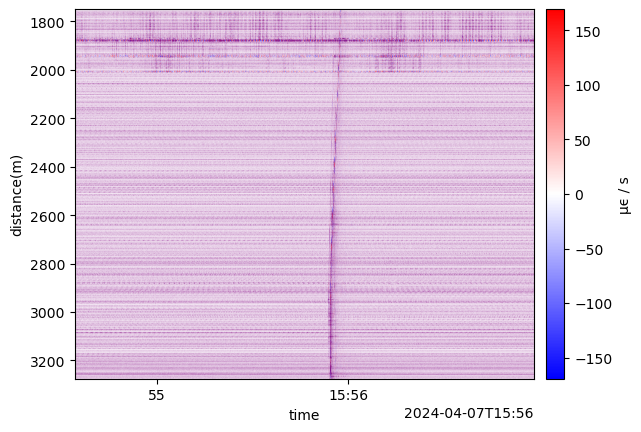

File: 16B_StrainRate_20240407T001752+0000_32455.h5
Time: 18:18:03.582000
Date: 6/4/2024
Magnitude: 1.29
Error: 1000000.0
rms: 48.8


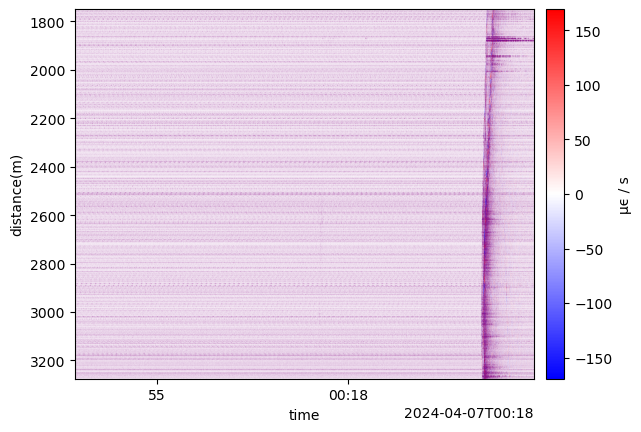

File: 16B_StrainRate_20240407T162904+0000_37311.h5
Time: 10:29:06.890500
Date: 7/4/2024
Magnitude: 0.98
Error: 1000000.0
rms: 21.86


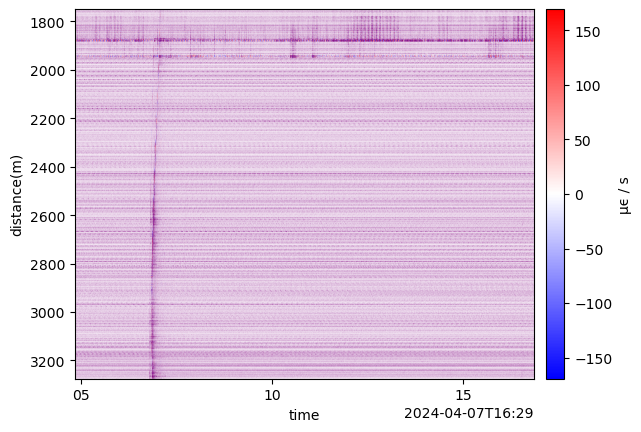

File: 16B_StrainRate_20240407T062652+0000_34300.h5
Time: 00:26:54.294250
Date: 7/4/2024
Magnitude: 0.95
Error: 1000000.0
rms: 16.59


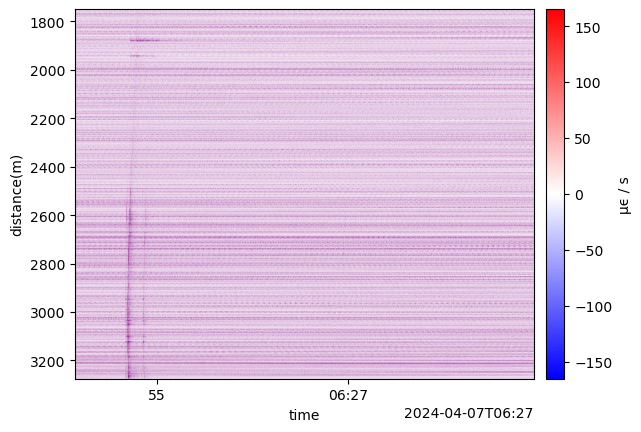

In [8]:
forge_path = '/bedrettolab/E1B/DAS/2024_FORGE/DATA_RAW_fromOpenei/April_2024/v1.0.0'

for index, row in selected_events.iterrows():
    event = row
    time, date = event['Trig_Time'].strip(), event['Trig_Date'].strip()
    magnitude = event['MomMag']
    error = event['Error']
    rms = event['rms_Noise']
    file_name = event['Matched_File'].strip()

    print(f'File: {file_name}\nTime: {time}\nDate: {date}\nMagnitude: {magnitude}\nError: {error}\nrms: {rms}')
    
    file_path = os.path.join(forge_path, file_name)
    try:
        patch = dc.spool(file_path)[0].transpose()
        patch.viz.waterfall(show=True, scale=0.05);
    except Exception as e:
        print(f"Error loading {file_name}: {e}")
    

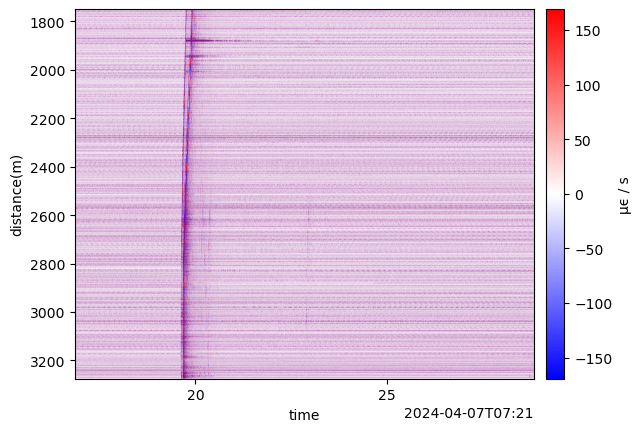

<Axes: xlabel='time', ylabel='distance(m)'>

In [64]:
# Select one event from the list - the one with the highest magnitude
event = selected_events.iloc[0]
file_name = event['Matched_File']
file_path = os.path.join(forge_path, file_name)
patch = dc.spool(file_path)[0].transpose()
patch.viz.waterfall(show=True, scale=0.05)

In [73]:
patch.coords

➤ Coordinates (distance: 1496, time: 120000)
    *distance: CoordRange( min: 1.75e+03 max: 3.28e+03 step: 1.0210915 shape: (1496,) dtype: float32 units: m )
    *time: CoordRange( min: 2024-04-07T07:21:16.8446839 max: 2024-04-07T07:21:28.844463901 step: 9.9999e-05s shape: (120000,) dtype: datetime64[ns] units: s )

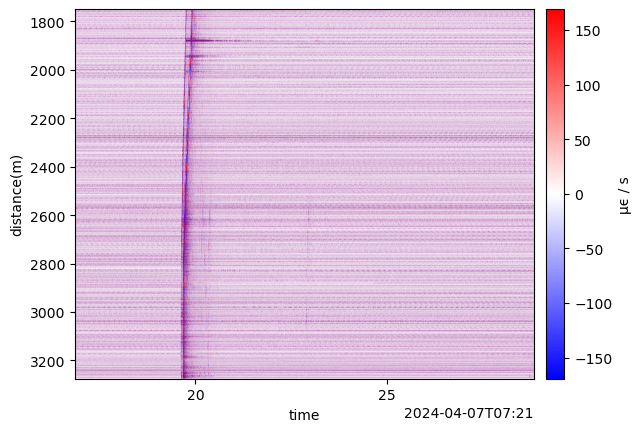

<Axes: xlabel='time', ylabel='distance(m)'>

In [212]:
patch.viz.waterfall(show=True, scale=0.05)

In [257]:
selected_depths

[2000, 2400, 2800]

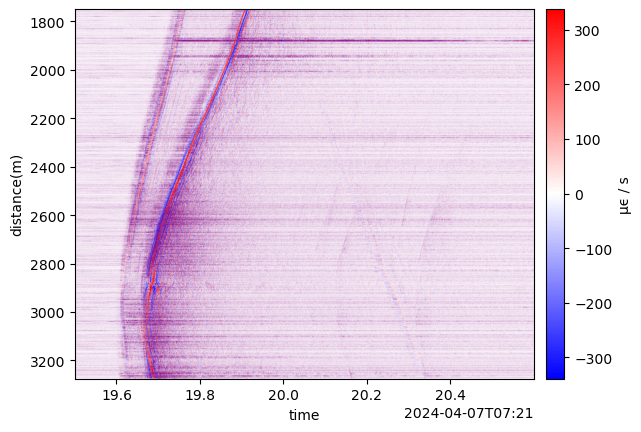

<Axes: xlabel='time', ylabel='distance(m)'>

In [167]:
selected_patch = patch.select(time=("2024-04-07T07:21:19.5","2024-04-07T07:21:20.6"))
selected_patch.viz.waterfall(show=True, scale=0.1)

# selected_patch = patch.select(time=(2.5,3.8), relative=True)
# selected_patch.viz.waterfall(show=True, scale=0.1)

In [247]:
selected_depths = [2000, 2400, 2800]
selected_channels = [int(max(0, np.floor((d-patch.coords.distance.min())/patch.coords.distance.step))) for d in selected_depths]
# depth = patch.coords.distance.min() + channel_id*patch.coords.distance.step

print(selected_channels)

[245, 637, 1029]


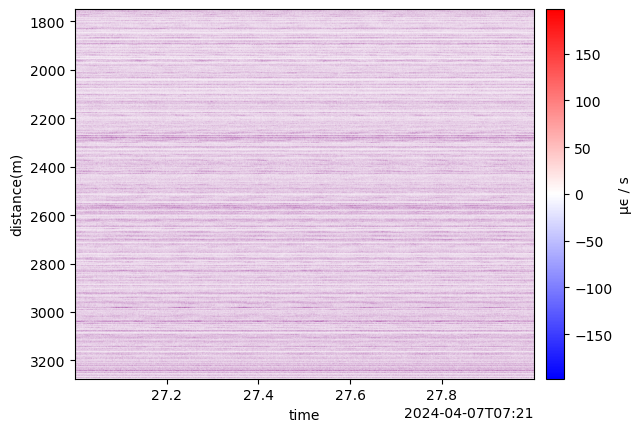

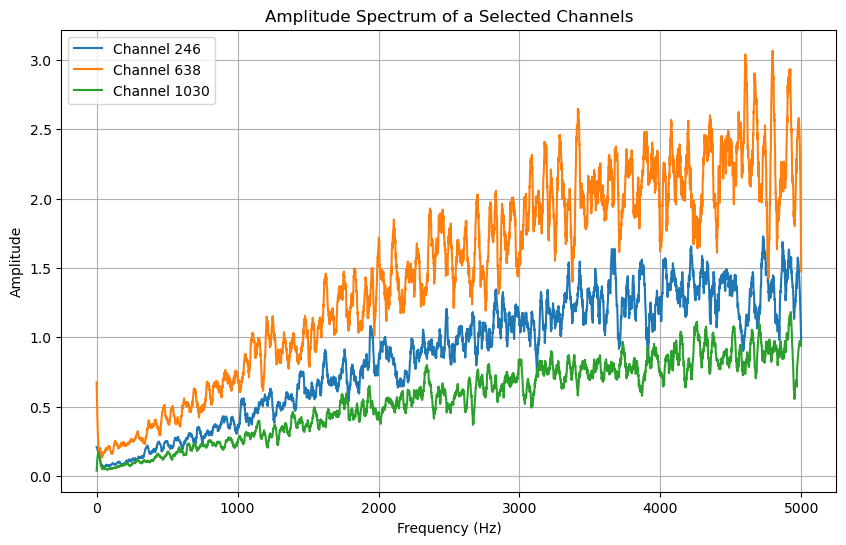

In [249]:
noise_win = ("2024-04-07T07:21:27","2024-04-07T07:21:28")
noise = patch.select(time=noise_win)
noise.viz.waterfall(show=True, scale=0.1)

plot_fft(noise, selected_channels)

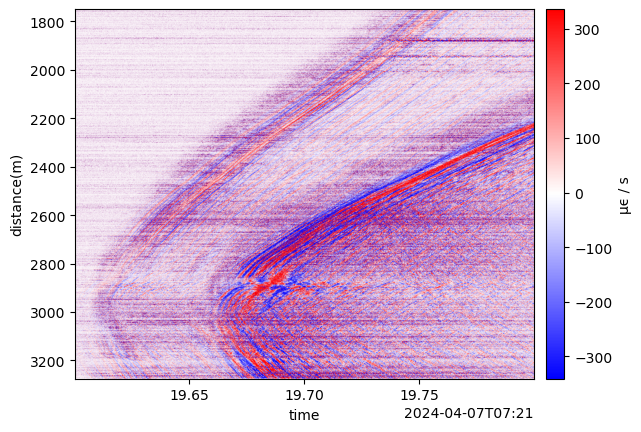

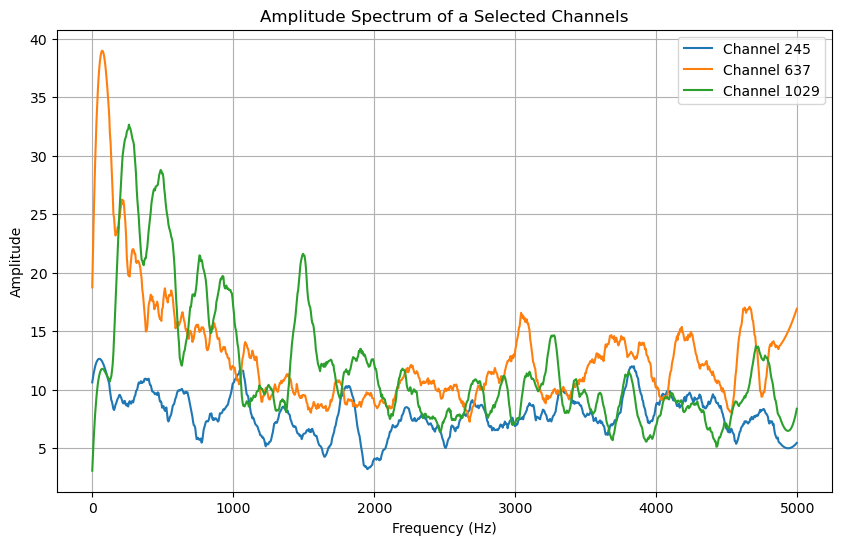

In [255]:
waves_win = ("2024-04-07T07:21:19.6","2024-04-07T07:21:19.8")
waves = patch.select(time=waves_win)
waves.viz.waterfall(show=True, scale=0.1)

plot_fft(waves, selected_channels, smooth=True)

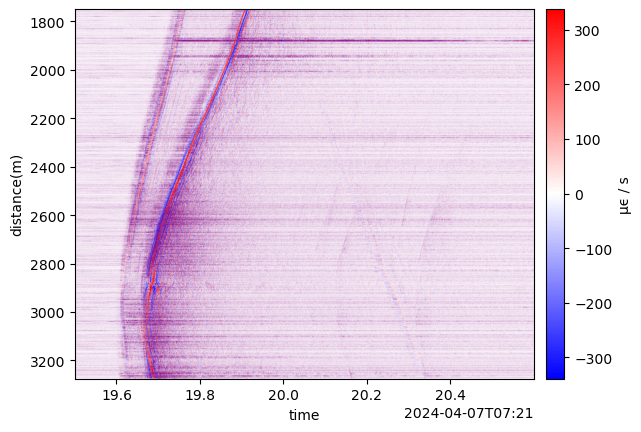

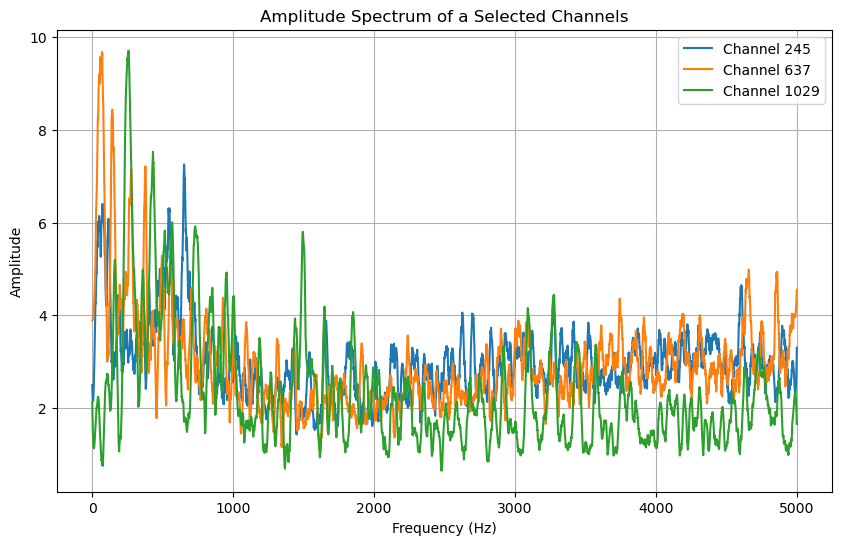

In [256]:
selected_patch.viz.waterfall(show=True, scale=0.1)
plot_fft(selected_patch, selected_channels)

In [279]:
# Create the figure
for i in range(len(selected_channels)):
    fig = go.Figure()

    # Add a trace for the line chart
    fig.add_trace(go.Scatter(x=np.array(selected_patch.coords.time), y=selected_patch.data[selected_channels[i]], mode='lines', name='Line Chart'))

    # Update layout (optional)
    fig.update_layout(title=f'Channel {selected_channels[i]}@{selected_depths[i]}m',
                    xaxis_title='Time (local)',
                    yaxis_title='Strain Rate',
                    width=800,
                    margin=dict(l=20, r=20, t=40, b=40)
    )

    # Show the figure
    fig.show()

In [ ]:
# P Wave
smooth = True
pwave = selected_patch.select(time=("2024-04-07T07:21:19.6","2024-04-07T07:21:19.78")).data[selected_channels[0]]

# Compute the FFT
Fs = 1/(selected_patch.attrs.coords['time'].step / np.timedelta64(1, 's'))
L = len(pwave)

X = np.fft.fft(pwave.data)
X = np.abs(X / L)
X = X[:L//2]
X[1:-1] = 2 * X[1:-1]  # Compensate for the dropped half

# Frequency axis
f = np.fft.fftfreq(L, d=1/Fs)[:L//2]  # Frequency axis

# Create a Plotly figure
fig = go.Figure()

# Add the FFT plot
if smooth:
    fig.add_trace(go.Scatter(x=f, y=savgol_filter(X, window_length=len(X)//50, polyorder=3), mode='lines', name='FFT Magnitude'))
else:
    fig.add_trace(go.Scatter(x=f, y=X, mode='lines', name='FFT Magnitude'))

# Update layout for better visualization
fig.update_layout(
    title=f'Amplitude Spectrum of P-Wave in Channel {selected_channels[0]}@{selected_depths[0]}m',
    xaxis_title='Frequency (Hz)',
    yaxis_title='Magnitude',
    width=800,
    font=dict(size=16),
    margin=dict(l=70, r=70, t=70, b=70)
)

# Show the figure
fig.show()


In [300]:
# S Wave
smooth = True
pwave = selected_patch.select(time=("2024-04-07T07:21:19.8","2024-04-07T07:21:20.2")).data[selected_channels[0]]

# Compute the FFT
Fs = 1/(selected_patch.attrs.coords['time'].step / np.timedelta64(1, 's'))
L = len(pwave)

X = np.fft.fft(pwave.data)
X = np.abs(X / L)
X = X[:L//2]
X[1:-1] = 2 * X[1:-1]  # Compensate for the dropped half

# Frequency axis
f = np.fft.fftfreq(L, d=1/Fs)[:L//2]  # Frequency axis

# Create a Plotly figure
fig = go.Figure()

# Add the FFT plot
if smooth:
    fig.add_trace(go.Scatter(x=f, y=savgol_filter(X, window_length=len(X)//50, polyorder=3), mode='lines', name='FFT Magnitude'))
else:
    fig.add_trace(go.Scatter(x=f, y=X, mode='lines', name='FFT Magnitude'))

# Update layout for better visualization
fig.update_layout(
    title=f'Amplitude Spectrum of S-Wave in Channel {selected_channels[0]}@{selected_depths[0]}m',
    xaxis_title='Frequency (Hz)',
    yaxis_title='Magnitude',
    width=800,
    font=dict(size=16),
    margin=dict(l=70, r=70, t=70, b=70)
)

# Show the figure
fig.show()

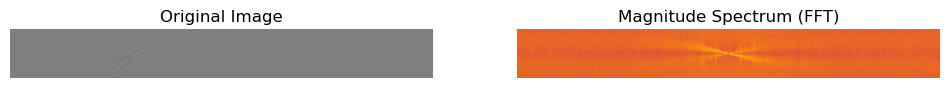

In [113]:
# Compute 2D FFT
fft_result = np.fft.fft2(selected_patch.data)

# Shift the zero-frequency component to the center
fft_shifted = np.fft.fftshift(fft_result)

# Compute magnitude spectrum (log scale for better visibility)
magnitude_spectrum = np.log1p(np.abs(fft_shifted))

# Plot original image and FFT spectrum
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(selected_patch.data, cmap="gray")
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(magnitude_spectrum, cmap="inferno")
plt.title("Magnitude Spectrum (FFT)")
plt.axis("off")

plt.show()

In [ ]:
freqs, t, Sxx = spectrogram(selected_patch.data[50,:], Fs, nperseg=512, noverlap=128)

# Create spectrogram plot
fig = px.imshow(10*np.log10(Sxx), 
                x=t, 
                y=freqs, 
                aspect="auto",  # Adjusts aspect ratio for squareness
                color_continuous_scale="inferno",
                origin='lower')

# Set axis labels
fig.update_layout(
    title="Spectrogram",
    xaxis_title="Time (s)",
    yaxis_title="Frequency (Hz)",
    coloraxis_colorbar_title="Power (dB)",
    width=600,
)
# Show plot
fig.show()